In [1]:
import kagglehub
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Download latest version
path = kagglehub.dataset_download("omniamahmoudsaeed/real-estate-sales-2001-2022")

print("Path to dataset files:", path)

C:\Users\mrsmo\anaconda3\envs\pandas_playground\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Path to dataset files: C:\Users\mrsmo\.cache\kagglehub\datasets\omniamahmoudsaeed\real-estate-sales-2001-2022\versions\1


In [2]:
pd.set_option("display.max_rows", None)

In [3]:

# Use raw string (prefix with r) to avoid backslash issues in Windows paths
file_path = r"C:\Users\mrsmo\.cache\kagglehub\datasets\omniamahmoudsaeed\real-estate-sales-2001-2022\versions\1\Real_Estate_Sales_2001-2022_GL.csv"

# Read the CSV
df = pd.read_csv(file_path, parse_dates=["Date Recorded"], low_memory=False)

# Preview the data
df.head()


,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
0,2020177,2020,2021-04-14,Ansonia,323 BEAVER ST,133000.0,248400.0,0.5354,Residential,Single Family,NaN,NaN,NaN,POINT (-73.06822 41.35014)
1,2020225,2020,2021-05-26,Ansonia,152 JACKSON ST,110500.0,239900.0,0.4606,Residential,Three Family,NaN,NaN,NaN,NaN
2,2020348,2020,2021-09-13,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.4630,Commercial,NaN,NaN,NaN,NaN,NaN
3,2020090,2020,2020-12-14,Ansonia,57 PLATT ST,127400.0,202500.0,0.6291,Residential,Two Family,NaN,NaN,NaN,NaN
4,210288,2021,2022-06-20,Avon,12 BYRON DRIVE,179990.0,362500.0,0.4965,Residential,Condo,NaN,NaN,NaN,POINT (-72.879115982 41.773452988)


In [4]:
df.dtypes

Serial Number                int64
List Year                    int64
Date Recorded       datetime64[ns]
Town                        object
Address                     object
Assessed Value             float64
Sale Amount                float64
Sales Ratio                float64
Property Type               object
Residential Type            object
Non Use Code                object
Assessor Remarks            object
OPM remarks                 object
Location                    object
dtype: object

In [5]:
df.shape

(1097629, 14)

In [6]:
df["Property Type"].value_counts()

Property Type
Single Family     401612
Residential       151064
Condo             105420
Two Family         26408
Three Family       12586
Vacant Land         7824
Commercial          5987
Four Family         2150
Apartments          1327
Industrial           795
Public Utility        10
Name: count, dtype: int64

In [7]:
df["Residential Type"].value_counts()


Residential Type
Single Family    508044
Condo            136822
Two Family        34848
Three Family      16567
Four Family        2959
Name: count, dtype: int64

In [8]:
df.info()
#1,097,629 rows with zero null rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1097629 entries, 0 to 1097628
Data columns (total 14 columns):
 #   Column            Non-Null Count    Dtype         
---  ------            --------------    -----         
 0   Serial Number     1097629 non-null  int64         
 1   List Year         1097629 non-null  int64         
 2   Date Recorded     1097627 non-null  datetime64[ns]
 3   Town              1097629 non-null  object        
 4   Address           1097578 non-null  object        
 5   Assessed Value    1097629 non-null  float64       
 6   Sale Amount       1097629 non-null  float64       
 7   Sales Ratio       1097629 non-null  float64       
 8   Property Type     715183 non-null   object        
 9   Residential Type  699240 non-null   object        
 10  Non Use Code      313451 non-null   object        
 11  Assessor Remarks  171228 non-null   object        
 12  OPM remarks       13031 non-null    object        
 13  Location          298111 non-null   object

In [9]:
df.isnull().sum()

Serial Number             0
List Year                 0
Date Recorded             2
Town                      0
Address                  51
Assessed Value            0
Sale Amount               0
Sales Ratio               0
Property Type        382446
Residential Type     398389
Non Use Code         784178
Assessor Remarks     926401
OPM remarks         1084598
Location             799518
dtype: int64

In [10]:
df.nunique()

Serial Number        96220
List Year               22
Date Recorded         6958
Town                   170
Address             771931
Assessed Value       99306
Sale Amount          61075
Sales Ratio         552974
Property Type           11
Residential Type         5
Non Use Code            74
Assessor Remarks     75286
OPM remarks           6490
Location            216556
dtype: int64

In [11]:
df["List Year"] = df["List Year"].astype("category")
df["Property Type"] = df["Property Type"].astype("category")
df["Residential Type"] = df["Residential Type"].astype("category")
df["Town"] = df["Town"].astype("category")
                                        


In [12]:
years = df.groupby("List Year")
years

C:\Users\mrsmo\AppData\Local\Temp\ipykernel_11848\243916455.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  years = df.groupby("List Year")


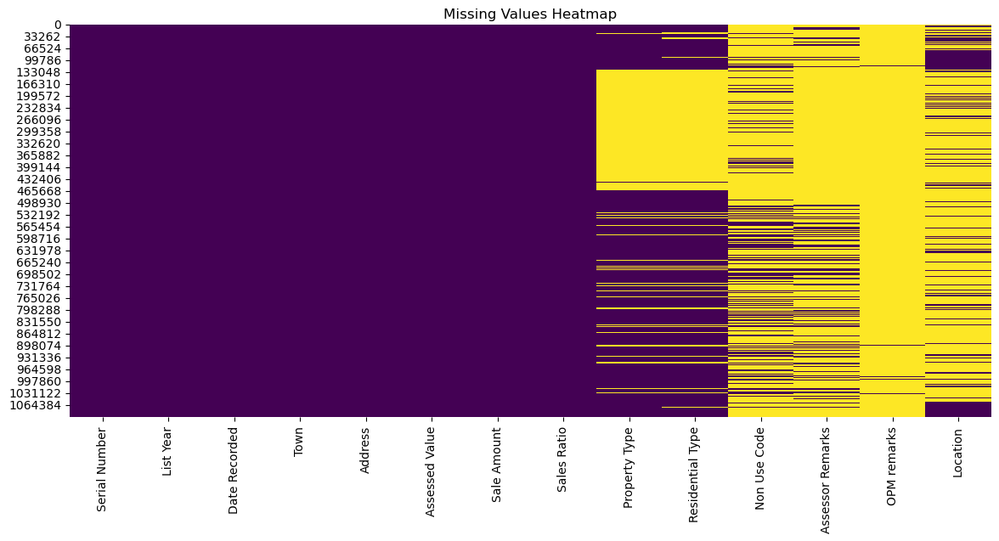

In [13]:
plt.figure(figsize=(14,6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

In [14]:
#Sales per year
years.size()

List Year
2001    59584
2002    59682
2003    64239
2004    84056
2005    61602
2006    48785
2007    35617
2008    32735
2009    42508
2010    33491
2011    31065
2012    35973
2013    39943
2014    49563
2015    46651
2016    49773
2017    45691
2018    50709
2019    58954
2020    66592
2021    56946
2022    43470
dtype: int64

In [15]:
years.first()

,Serial Number,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
List Year,,,,,,,,,,,,,
2001,10573,2002-01-10,Danbury,166 OLD BROOKFIELD RD,81100.0,180000.0,0.450556,NaN,NaN,7,None,None,POINT (-72.87317 41.27318)
2002,20163,2003-03-18,Darien,30 MAPLE ST,376040.0,827500.0,0.454429,NaN,NaN,17,None,None,POINT (-72.35323 41.82389)
2003,30386,2004-07-08,Bethel,34 ROCKWELL RD,183510.0,445000.0,0.412382,NaN,NaN,7,None,None,POINT (-73.56596 41.03228)
2004,40322,2005-05-31,Oxford,NEWGATE RD,0.0,170000.0,0.000000,NaN,NaN,7,None,None,POINT (-72.5145 41.29679)
2005,50679,2006-03-31,Bristol,135 EAST,92670.0,210000.0,0.441286,NaN,NaN,1,None,None,POINT (-73.40217 41.4453)
2006,60398,2007-08-24,New London,PLANT ST,41720.0,80000.0,0.521500,Condo,Condo,25 - Other,RELOCATION,None,POINT (-73.48016 41.31533)
2007,70927,2008-04-01,Bridgeport,4775 MAIN ST,389200.0,785000.0,0.495796,Condo,Condo,01 - Family,110-19BB,None,POINT (-72.68536 41.78221)
2008,8080,2009-03-20,North Haven,30 BROADWAY,353010.0,585000.0,0.603436,Condo,Condo,16 - Charitable Group,ESTATE SALE,None,POINT (-72.57949 42.02372)
2009,900038,2010-05-21,Kent,GORHAM RD,164600.0,160000.0,1.028750,Condo,Condo,14 - Foreclosure,G16092,None,POINT (-72.75823 41.31685)


In [16]:
years.last()

,Serial Number,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
List Year,,,,,,,,,,,,,
2001,10328,2002-05-02,Wethersfield,16 DESMOND DR,119800.0,235000.0,0.509787,NaN,NaN,1,None,None,POINT (-72.65385 41.82445)
2002,20490,2003-04-29,Wallingford,47 BLAKESLEE RD,115000.0,245000.0,0.469388,NaN,NaN,7,None,None,POINT (-72.73765 41.744)
2003,32038,2004-06-23,Waterbury,101 LAKEVIEW AVE,64750.0,109300.0,0.592406,NaN,NaN,7,None,None,POINT (-73.54835 41.04267)
2004,42174,2005-06-03,Waterbury,95 CLINTON ST,58870.0,137900.0,0.426904,NaN,NaN,25,None,None,POINT (-72.14337 41.35028)
2005,50029,2005-10-26,Plainville,35 BASSWOOD ST,117290.0,227000.0,0.516696,NaN,NaN,7,None,None,POINT (-73.24424 41.48275)
2006,60212,2007-06-11,Windsor Locks,135 SUNSET ST,158200.0,275000.0,0.575273,Single Family,Single Family,07 - Change in Property,MOBILE HOME,None,POINT (-73.4579 41.26008)
2007,70044,2007-10-12,Southington,614 WINDING RIDGE,98070.0,290000.0,0.338172,Single Family,Single Family,08 - Part Interest,ASSESS > SALE,None,POINT (-72.69537 41.76521)
2008,800074,2009-05-04,Prospect,25 ROSEMARY RD,88440.0,90000.0,0.982667,Single Family,Single Family,25 - Other,SHORT SALE,None,POINT (-72.96323 41.52241)
2009,90178,2010-05-17,Ridgefield,22 CHRISTOPHER RD,442720.0,524000.0,0.844885,Single Family,Single Family,25 - Other,SOLD FOR LOWER THAN ASSESSMENT,None,POINT (-73.46631 41.11328)


<Axes: xlabel='List Year'>

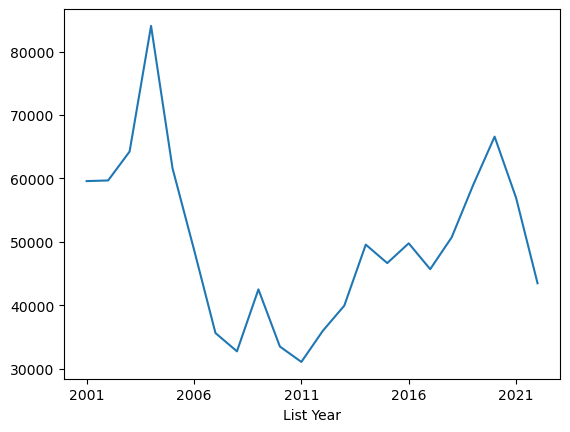

In [17]:
years.size().plot()

In [18]:
town = df.groupby("Town")
town_counts = town.size()

C:\Users\mrsmo\AppData\Local\Temp\ipykernel_11848\383015132.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  town = df.groupby("Town")


In [19]:
town_counts[town_counts == town_counts.max()]

Town
Bridgeport    38158
dtype: int64

In [20]:
town_counts = df.groupby("Town").size().reset_index(name = "Count")
town_counts

C:\Users\mrsmo\AppData\Local\Temp\ipykernel_11848\1068564665.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  town_counts = df.groupby("Town").size().reset_index(name = "Count")


,Town,Count
0,***Unknown***,1
1,Andover,932
2,Ansonia,5017
3,Ashford,1467
4,Avon,7866
5,Barkhamsted,1191
6,Beacon Falls,2034
7,Berlin,6030
8,Bethany,1799
9,Bethel,6004


In [21]:
sales_ratio_by_town = town["Sales Ratio"].mean()
sales_ratio_by_town

Town
***Unknown***         0.235582
Andover               0.778054
Ansonia               0.908401
Ashford               0.902646
Avon                  1.002314
Barkhamsted           0.984840
Beacon Falls        190.134711
Berlin                1.293822
Bethany             234.519723
Bethel                1.024363
Bethlehem             0.857323
Bloomfield            0.731483
Bolton                0.822530
Bozrah                0.736718
Branford              0.851198
Bridgeport            7.760988
Bridgewater           0.978482
Bristol               1.471434
Brookfield           87.181958
Brooklyn             87.737172
Burlington            0.860581
Canaan                1.163567
Canterbury            0.937977
Canton                0.859886
Chaplin               0.891615
Cheshire              0.850068
Chester               0.935985
Clinton               0.931367
Colchester            0.699670
Colebrook             1.247804
Columbia              0.837304
Cornwall              1.369209
Cov

Sales ratio data was found to be skewed by several situations. Certain towns were found to have outlier Sales Ratios because of different
types of data recording having to do with sales that were not arms length or for properties being bought or transferred to the cities and counties through eminent domain.  The list of bad indices was created after sales were filtered by Town.  Average arms length sales that represent more accurate market value sales have a Sales Ratio of Assessed Value to Sale Amount of anywhere from .30 to .80.  Some towns were found to have an avergae Sales ratio of over 30 up to 150 because of million dollar properties where the sale was rocorded for 1 dollar, or properties that were presumably split amongst family members and the sales was recorded at 1000.00/family member when the assessed value was well over $200,000.  It was decided that the best way to deal with the outliers was to replace simply the sale ratio for those anomalous situations with Nan.

In [22]:
bad_indices = [400223, 387198, 756066, 517857, 950063, 953854, 1076552, 610694, 514136, 395137, 393010, 390655,
               247298, 417869, 474399, 221364, 478279, 251354, 423895,433617, 863110, 134811, 397613, 479568, 666388, 811579, 413974,
               55055, 270157,480988, 482770, 271053, 274878, 312695, 353650, 361096, 381148, 384550, 705544, 740634, 750658, 
               466006, 671159, 477350, 457875, 460176, 402630, 339155, 411821, 411133, 91602,92379, 92547, 92576, 93312, 93480, 93922,
               93958, 94517, 94557, 94807, 95881, 95920, 96250, 98359, 97738, 96673, 96280, 100898, 100500, 98910, 98664, 102937, 101464, 101250, 103665, 
                105660, 108030, 108015, 107930, 107604, 107292, 1096079, 1096037, 1095863, 1089984, 1090576, 1091434, 1092817, 1093416,
               1094013, 1094167, 1097459
              ]
df.loc[bad_indices, "Sales Ratio"] = np.nan

In [23]:
#Sales Ratio data after outlier sales ratio value are replaced with Nan
sales_ratio_by_town = town["Sales Ratio"].mean()
sales_ratio_by_town

Town
***Unknown***        0.235582
Andover              0.778054
Ansonia              0.908401
Ashford              0.902646
Avon                 1.002314
Barkhamsted          0.984840
Beacon Falls         0.687316
Berlin               1.293822
Bethany              0.666764
Bethel               1.024363
Bethlehem            0.857323
Bloomfield           0.731483
Bolton               0.822530
Bozrah               0.736718
Branford             0.851198
Bridgeport           7.760988
Bridgewater          0.978482
Bristol              1.471434
Brookfield           0.854125
Brooklyn             0.827339
Burlington           0.860581
Canaan               1.163567
Canterbury           0.937977
Canton               0.859886
Chaplin              0.891615
Cheshire             0.850068
Chester              0.935985
Clinton              0.931367
Colchester           0.699670
Colebrook            1.247804
Columbia             0.837304
Cornwall             1.369209
Coventry             0.868997
Cromw

In [40]:
sales_ratio_df = town["Sales Ratio"].mean().reset_index()
sales_ratio_df.columns = ["Town", "Avg_Sales_Ratio"]
sales_ratio_df

,Town,Avg_Sales_Ratio
0,***Unknown***,0.235582
1,Andover,0.778054
2,Ansonia,0.908401
3,Ashford,0.902646
4,Avon,1.002314
5,Barkhamsted,0.984840
6,Beacon Falls,0.687316
7,Berlin,1.293822
8,Bethany,0.666764
9,Bethel,1.024363


In [25]:
#Towns with outlier Sales Ratio values isolated

In [26]:
bethany_df = df[df["Town"] == "Bethany"]
bethany_df

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
385,210068,2021,2022-06-14,Bethany,15 RAINBOW RD,179860.0,395000.0,0.455300,Residential,Single Family,NaN,NaN,NaN,POINT (-72.981093988 41.439975994)
450,210084,2021,2022-07-28,Bethany,16 COACHMANS LN,406580.0,800000.0,0.508200,Residential,Single Family,NaN,NaN,NaN,POINT (-73.034621995 41.414706987)
528,210018,2021,2021-11-16,Bethany,530 BETHMOUR RD,228780.0,375000.0,0.610000,Residential,Single Family,NaN,NaN,NaN,POINT (-73.009462037 41.413549991)
829,210062,2021,2022-05-18,Bethany,55 HATFIELD HILL RD,256560.0,380000.0,0.675158,Residential,Single Family,28 - Use Assessment,NaN,NaN,POINT (-72.977588006 41.413687999)
1831,210051,2021,2022-03-08,Bethany,655 LITCHFIELD TPK,272410.0,712500.0,0.382300,Residential,Single Family,NaN,NaN,NaN,POINT (-72.982926021 41.435796987)
2132,210056,2021,2022-04-14,Bethany,59 BETHANY FARMS RD,395990.0,710000.0,0.557700,Residential,Single Family,NaN,NaN,NaN,POINT (-73.02366601 41.397644994)
2402,210073,2021,2022-06-27,Bethany,21 PECK RD,207510.0,475000.0,0.436800,Residential,Single Family,NaN,SINGLE FAMILY W/ACC APARTMENT,NaN,POINT (-72.999484973 41.421344993)
2469,210089,2021,2022-08-09,Bethany,88 HUMISTON DR,367120.0,1250000.0,0.293600,Residential,Single Family,NaN,NaN,NaN,POINT (-72.978850991 41.449193992)
2608,210003,2021,2021-10-05,Bethany,20 FATIMA DR,233330.0,423000.0,0.551600,Residential,Single Family,NaN,NaN,NaN,POINT (-73.036676987 41.40819999)
2931,210029,2021,2021-12-07,Bethany,321 BETHMOUR RD,226220.0,405000.0,0.558500,Residential,Single Family,NaN,NaN,NaN,POINT (-73.020602005 41.407990987)


In [27]:
bethany_df["Sales Ratio"].mean()

np.float64(0.6667635525434299)

In [28]:
high_ratio_bethany = bethany_df[bethany_df["Sales Ratio"] > 2]
high_ratio_bethany.shape

(51, 14)

In [29]:
high_ratio_bethany

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
24933,200018,2020,2020-11-03,Bethany,340 AMITY RD,81430.0,15000.0,5.428600,Vacant Land,NaN,01 - Family,NaN,NaN,NaN
76232,210010,2021,2021-10-26,Bethany,75 ANTHONY COURT,28690.0,10000.0,2.869000,Vacant Land,NaN,12 - Non Buildable Lot,ALSO WAS A DEATH CERTICATE FOR OWNER,NaN,POINT (-73.029375674 41.399511308)
84435,210017,2021,2021-11-16,Bethany,1070 AMITY RD UNIT 37,22510.0,5281.0,4.262450,Residential,Single Family,07 - Change in Property,IN DISREPAIR/ABANDONED,NaN,POINT (-72.994482989 41.462408985)
125732,19011,2001,2001-11-27,Bethany,48 FARM VIEW RD,78750.0,35000.0,2.250000,NaN,NaN,7,NaN,NaN,NaN
128894,10111,2001,2002-05-28,Bethany,16 COUNTRY LN,76930.0,35000.0,2.198000,NaN,NaN,3,NaN,NaN,NaN
130179,10026,2001,2001-11-16,Bethany,48 ACORN DR,73640.0,35000.0,2.104000,NaN,NaN,7,NaN,NaN,NaN
132257,10051,2001,2002-01-16,Bethany,50 BRIAR RD,80500.0,35000.0,2.300000,NaN,NaN,7,NaN,NaN,NaN
134043,10109,2001,2002-05-23,Bethany,67 COUNTRY LN,96180.0,35000.0,2.748000,NaN,NaN,3,NaN,NaN,NaN
138648,10003,2001,2001-10-04,Bethany,16 FALLS RD,66060.0,12500.0,5.284800,NaN,NaN,7,NaN,NaN,POINT (-72.99672 41.42865)
139205,10075,2001,2002-03-26,Bethany,74 FARMVIEW RD,72520.0,35000.0,2.072000,NaN,NaN,3,NaN,NaN,NaN


In [30]:
beacon_df = df[df["Town"] == "Beacon Falls"]
beacon_df

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
8,200046,2020,2021-01-25,Beacon Falls,34 LASKY ROAD,158030.0,243000.0,0.650300,Residential,Single Family,NaN,NaN,NaN,NaN
9,200016,2020,2020-11-13,Beacon Falls,9 AVON COURT,65590.0,100000.0,0.655900,Residential,Condo,NaN,NaN,NaN,NaN
4305,200081,2020,2021-05-11,Beacon Falls,10 LAUREL RIDGE,323900.0,520000.0,0.622800,Residential,Condo,NaN,NaN,NaN,NaN
4308,200058,2020,2021-03-05,Beacon Falls,284 COOK LANE,51230.0,100000.0,0.512300,Vacant Land,NaN,NaN,VACANT LOT IN A SUBDIVISION,NaN,POINT (-73.04646 41.43856)
4491,200129,2020,2021-08-09,Beacon Falls,300 PINESBRIDGE ROAD,199950.0,345000.0,0.579500,Residential,Single Family,NaN,NaN,NaN,POINT (-73.08509 41.43037)
4699,200070,2020,2021-04-13,Beacon Falls,95 DORCHESTER COURT,70590.0,152000.0,0.464400,Residential,Condo,NaN,NaN,NaN,NaN
4767,200024,2020,2020-11-24,Beacon Falls,13 THIRD STREET,15510.0,13000.0,1.193000,Residential,Single Family,25 - Other,MOBILE HOME VERY OLD,NaN,NaN
4861,200092,2020,2021-06-09,Beacon Falls,193 CONCORD COURT,74340.0,165000.0,0.450500,Residential,Condo,NaN,NaN,NaN,POINT (-73.03645 41.46365)
4922,200103,2020,2021-07-06,Beacon Falls,5 COUNTRY COURT,123970.0,299000.0,0.414600,Residential,Two Family,NaN,NaN,NaN,NaN
5070,200019,2020,2020-11-18,Beacon Falls,15 TWIN OAKS TRAIL,0.0,506581.0,0.000000,Residential,Condo,07 - Change in Property,NEW CONSTRUCTION,NaN,POINT (-73.03775 41.42508)


In [31]:
beacon_df.shape

(2034, 14)

In [32]:
high_ratio_beacon = beacon_df[beacon_df["Sales Ratio"] > 2]
high_ratio_beacon.shape

(47, 14)

In [33]:
high_ratio_beacon

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
7866,200082,2020,2021-05-14,Beacon Falls,57 MAPLE AVENUE,128140.0,61020.0,2.099900,Residential,Single Family,01 - Family,PART INTEREST BETWEEN FAMILY,NaN,NaN
14837,200083,2020,2021-05-14,Beacon Falls,57 MAPLE AVENUE,128140.0,61020.0,2.099900,Residential,Single Family,01 - Family,PART INTEREST BETWEEN FAMILY,NaN,NaN
16470,200111,2020,2021-07-15,Beacon Falls,15 THIRD STREET,14900.0,2500.0,5.960000,Residential,Single Family,25 - Other,Owner Deceased Poor Condition,NaN,POINT (-73.07192 41.41159)
243092,30048,2003,2003-12-29,Beacon Falls,24 DONNA ST,15540.0,5000.0,3.108000,NaN,NaN,22,NaN,NaN,NaN
248188,30079,2003,2004-03-22,Beacon Falls,13 DONNA ST,18150.0,4000.0,4.537500,NaN,NaN,14,NaN,NaN,POINT (-73.07113 41.41083)
303226,40053,2004,2005-03-01,Beacon Falls,10 DONNA ST,10160.0,4000.0,2.540000,NaN,NaN,3,NaN,NaN,NaN
306971,40043,2004,2005-01-24,Beacon Falls,196 BLACKBERRY HL RD,132540.0,16000.0,8.283750,NaN,NaN,1,NaN,NaN,NaN
320356,40060,2004,2005-03-24,Beacon Falls,19 LORRAINE DR,120440.0,10000.0,12.044000,NaN,NaN,1,NaN,NaN,NaN
323891,40126,2004,2005-08-31,Beacon Falls,196 BLACKBERRY HL RD,132540.0,16000.0,8.283750,NaN,NaN,1,NaN,NaN,NaN
493008,70021,2007,2007-12-17,Beacon Falls,9 DONNA ST,23070.0,8000.0,2.883750,Single Family,Single Family,25 - Other,MOBILE HOME - ASSESS > SALE - SOLD BACK TO PAR...,NaN,NaN


In [34]:
#used to change ratio values that were over 1000% and skewing the sales_ratio mean for Bethany and Beacon Falls
bad_indices = [400223, 387198, 756066, 517857, 950063, 953854]
df.loc[bad_indices, "Sales Ratio"] = np.nan

In [35]:
brookfield_df = df[df["Town"] == "Brookfield"]
brookfield_df

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
35,20000048,2020,2020-11-04,Brookfield,101 OBTUSE RD SOUTH,378680.0,537000.0,0.705177,Residential,Single Family,NaN,NaN,NaN,NaN
4119,20000009,2020,2020-10-08,Brookfield,35 INDIAN TRAIL,315430.0,660000.0,0.477900,Residential,Single Family,25 - Other,SOLD WITH 36A INDIAN TRAIL,NaN,NaN
4122,200000324,2020,2021-07-07,Brookfield,30 GREAT HERON LN,327010.0,467000.0,0.700200,Residential,Condo,NaN,NaN,NaN,POINT (-73.41341 41.49007)
4136,20000104,2020,2020-12-14,Brookfield,14 BRISTOL PATH UNIT #14,141730.0,215000.0,0.659209,Residential,Condo,25 - Other,SOLD W/ GARAGE,NaN,POINT (-73.39126 41.46692)
4144,20000209,2020,2021-03-18,Brookfield,162 LONG MEADOW HILL RD,237840.0,375000.0,0.634200,Residential,Single Family,25 - Other,ESTATE,NaN,POINT (-73.40103 41.5027)
4145,200000382,2020,2021-08-19,Brookfield,10 MEADOW DR,223440.0,450000.0,0.496500,Residential,Single Family,NaN,NaN,NaN,NaN
4205,20000078,2020,2020-11-20,Brookfield,12 BROOKFIELD MEADOWS,187170.0,345000.0,0.542500,Residential,Single Family,NaN,NaN,NaN,NaN
4218,20000172,2020,2021-02-16,Brookfield,129 NORTH LAKE SHORE DR,230610.0,500000.0,0.461200,Residential,Single Family,NaN,NaN,NaN,NaN
4231,20000029,2020,2020-10-20,Brookfield,40 LEDGEWOOD DR,166530.0,300000.0,0.555100,Residential,Condo,NaN,NaN,NaN,POINT (-73.39218 41.46363)
4254,200000259,2020,2021-05-17,Brookfield,23 RIVERVIEW CT,191900.0,315000.0,0.609200,Residential,Condo,NaN,NaN,NaN,NaN


In [36]:
brookfield_df.shape

(6025, 14)

In [37]:
high_ratio_brookfield = brookfield_df[brookfield_df["Sales Ratio"] > 2]
high_ratio_brookfield

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
6594,200000434,2020,2021-09-29,Brookfield,143 FEDERAL RD,10044290.0,158000.0,63.571400,Industrial,NaN,15 - Government Agency,"STATE BOUGHT 9,770 SQ FEET",NaN,POINT (-73.40655 41.43755)
10177,200000362,2020,2021-08-10,Brookfield,105 GRAYS BRIDGE RD,911640.0,331250.0,2.752121,Industrial,NaN,08 - Part Interest,SOLD W/ 121 GRAYS BRIDGE,NaN,POINT (-73.40224 41.43932)
13110,20000131,2020,2021-01-08,Brookfield,201 FEDERAL RD,3442430.0,29000.0,118.704483,Industrial,NaN,06 - Portion of Property,SOLD PORTION OF LAND TO STATE OF CT,NaN,NaN
17150,20000051,2020,2020-11-05,Brookfield,3 MEADOW VIEW DR,400870.0,131684.0,3.044182,Residential,Single Family,01 - Family,FAMILY SALE,NaN,POINT (-73.4036 41.48453)
17863,20000174,2020,2021-02-16,Brookfield,13 SILVERMINE MANOR,112370.0,15000.0,7.491300,Residential,Condo,01 - Family,FAMILY SALE,NaN,POINT (-73.39235 41.46887)
22139,20000183,2020,2021-02-25,Brookfield,328 FEDERAL RD,349380.0,14000.0,24.955714,Commercial,NaN,06 - Portion of Property,DOT TAKING PORTION,NaN,NaN
23406,20000139,2020,2021-01-15,Brookfield,165 FEDERAL RD,1749500.0,61500.0,28.447154,Industrial,NaN,06 - Portion of Property,GOODWILL- DOT TAKING,NaN,POINT (-73.40641 41.43949)
183542,20001,2002,2002-10-01,Brookfield,7 MOUNTAINVIEW DR,143860.0,2500.0,57.544000,NaN,NaN,6,NaN,NaN,NaN
184208,20002,2002,2002-10-01,Brookfield,3 MOUNTAINVIEW DR,131960.0,2500.0,52.784000,NaN,NaN,6,NaN,NaN,NaN
185425,20044,2002,2002-11-14,Brookfield,11 MTN VIEW DR,121110.0,27000.0,4.485556,NaN,NaN,1,NaN,NaN,NaN


In [38]:
high_ratio_brookfield.shape

(100, 14)

In [39]:
bad_indices[1076552, 1061550, 610694, 514136, 395137, 393010, 390655]
df.loc[bad_indices, "Sales Ratio"] = np.nan

TypeError: list indices must be integers or slices, not tuple

In [ ]:
newfairfield_df = df[df["Town"] == "New Fairfield"]
newfairfield_df

In [ ]:
newfairfield_df.shape

In [ ]:
high_ratio_newfair = newfairfield_df[newfairfield_df["Sales Ratio"] > 2]
high_ratio_newfair

In [ ]:
high_ratio_newfair.shape

In [ ]:
salisbury_df = df[df["Town"] == "Salisbury"]
salisbury_df

In [ ]:
salisbury_df.shape

In [ ]:
brooklyn_df = df[df["Town"] == "Brooklyn"]
brooklyn_df

In [ ]:
brooklyn_df.shape

In [ ]:
guilford_df = df[df["Town"] == "Guilford"]
guilford_df

In [ ]:
guilford_df.shape

In [ ]:
high_ratio_guilford = guilford_df[guilford_df["Sales Ratio"] > 2]
high_ratio_guilford

In [ ]:
high_ratio_guilford.shape

In [ ]:
middlebury_df = df[df["Town"] == "Middlebury"]
middlebury_df

In [ ]:
middlebury_df.shape

In [ ]:
high_ratio_middlebury = middlebury_df[middlebury_df["Sales Ratio"] > 2]
high_ratio_middlebury

In [ ]:
high_ratio_middlebury.shape

In [ ]:
newtown_df = df[df["Town"] == "Newtown"]
newtown_df

In [ ]:
newtown_df.shape

In [ ]:
high_ratio_newtown = newtown_df[newtown_df["Sales Ratio"] > 2]
high_ratio_newtown

In [ ]:
high_ratio_newtown.shape

In [ ]:
thompson_df = df[df["Town"] == "Thompson"]
thompson_df

In [ ]:
high_ratio_thompson = thompson_df[thompson_df["Sales Ratio"] > 2]
high_ratio_thompson

In [ ]:
high_ratio_thompson.shape

In [ ]:
westport_df = df[df["Town"] == "Westport"]
westport_df

In [ ]:
high_ratio_westport = westport_df[westport_df["Sales Ratio"] > 2]
high_ratio_westport

In [ ]:
high_ratio_westport.shape

In [ ]:
haddam_df = df[df["Town"] == "Haddam"]
haddam_df

In [ ]:
high_ratio_haddam = haddam_df[haddam_df["Sales Ratio"] > 2]
high_ratio_haddam

In [ ]:
high_ratio_haddam.shape

In [ ]:
mansfield_df = df[df["Town"] == "Mansfield"]
mansfield_df

In [ ]:
high_ratio_mansfield = mansfield_df[mansfield_df["Sales Ratio"] > 2]
high_ratio_mansfield

In [ ]:
high_ratio_mansfield.shape

In [ ]:
monroe_df = df[df["Town"] == "Monroe"]
monroe_df

In [ ]:
high_ratio_monroe = monroe_df[monroe_df["Sales Ratio"] > 2]
high_ratio_monroe

In [ ]:
high_ratio_monroe.shape

In [ ]:
putnam_df = df[df["Town"] == "Putnam"]
putnam_df

In [ ]:
high_ratio_putnam = putnam_df[putnam_df["Sales Ratio"] > 2]
high_ratio_putnam

In [ ]:
stafford_df = df[df["Town"] == "Stafford"]
stafford_df

In [ ]:
high_ratio_stafford = stafford_df[stafford_df["Sales Ratio"] > 2]
high_ratio_stafford